# Matching mystery paintings to famous ones

This project was inspired by someone in my family. The idea first came to me over Christmas. When we covered image clustering in Week 6, I realised it would be the perfect opportunity to actually try and build it.
While visiting a family member over the holidays, they mentioned that after a relative had passed away, they had inherited some paintings, but had no idea what style or artists they even were. Nobody in my family has any real expertise when it comes to art, so they were essentially stuck. That's when I was thinking whether we could use machine learning to figure out at least the basics about them.
The goal became to compare the paintings my family member had sent me photos of (mystery paintings how i call them throughout the code) against a dataset of existing works. I wanted to see if we could identify any details about them, in particular the style they belong to. 

The project was structured in the following way:
I found a dataset on Kaggle containing around 50 artists and 8683 paintings in total (in the resized folder), along with a CSV file with details about each artist - their name, art style, and more.
https://www.kaggle.com/datasets/ikarus777/best-artworks-of-all-time

I then uploaded my own photos of the mistery paintings (in the mystery art folder) and compared each one against the full dataset to find which cluster it belongs to, giving us an idea of the style and potentially the artist it most resembles.

For some reason the code works only in the mml envrionment (more specifically mll3) (I had the same issue in class with Week 6)

In [2]:
!pip install torch torchvision

In [3]:
#Importing everything
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
import numpy as np
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import os
import glob
print("all imports ok!")

all imports ok!


# Manipulating the famous artists dataset

Get all the images in the dataset

In [4]:
# Get paths using absolute path 
paths = glob.glob("/Users/daria/datasets/resized/resized/*.jpg")
print(f"Found {len(paths)} images")

Found 8355 images


# Different tests to process the images

I ran into a lot of issues loading and processing the images, so the cells below are just me testing things out and figuring out where it was going wrong.

In [5]:
#Test one image 
im = Image.open(paths[0]).convert('RGB') #make sure the images have 3 channels 
im = im.resize((224, 224))
print("single image ok:", im.size)

single image ok: (224, 224)


In [6]:
im = Image.open(paths[0]).convert('RGB')
im = im.resize((224, 224))
arr = np.array(im, dtype=np.float32) / 255.0 #coverts the value to 0-1 
print("numpy done!", arr.shape, flush=True)

numpy done! (224, 224, 3)


In [7]:
#convert this into a format for Mobile net 
tensor = torch.from_numpy(arr).permute(2, 0, 1).unsqueeze(0)
print("tensor done!", tensor.shape, flush=True)

tensor done! torch.Size([1, 3, 224, 224])


I decided to use MobileNet, the same model we used in Week 6. I really liked the idea of comparing paintings through numbers rather than pixels. I wanted to explore it further on my own dataset and see what it could find.

In [8]:
#load mobile net
model = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.DEFAULT)
model.eval()
print("model loaded!", flush=True)

model loaded!


# Extracting the features

In [10]:
#test the extraction of the features on just 1 image first 
with torch.no_grad():
    im = Image.open(paths[0]).convert('RGB')
    im = im.resize((224, 224))
    arr = np.array(im, dtype=np.float32) / 255.0
    tensor = torch.from_numpy(arr).permute(2, 0, 1).unsqueeze(0)
    print("tensor done!", flush=True)
    feat = model(tensor)
    print("features extracted!", feat.shape, flush=True)

tensor done!
features extracted! torch.Size([1, 1000])


In [11]:
#extract features of all the images in the dataset, added a printed line to every 200 images as it was loading quite slowly 
features_list = []
valid_paths = []

with torch.no_grad():
    for idx, path in enumerate(paths):
        try:
            im = Image.open(path).convert('RGB')
            im = im.resize((224, 224))
            arr = np.array(im, dtype=np.float32) / 255.0
            tensor = torch.from_numpy(arr).permute(2, 0, 1).unsqueeze(0)
            feat = model(tensor)
            features_list.append(feat.squeeze().numpy())
            valid_paths.append(path)
        except Exception as e:
            print(f"Skipped {path}: {e}", flush=True)
        if idx % 200 == 0:
            print(f"Processed {idx}/{len(paths)}...", flush=True)

features = np.array(features_list)
print("Done!", features.shape)

Processed 0/8355...
Processed 200/8355...
Processed 400/8355...
Processed 600/8355...
Processed 800/8355...
Processed 1000/8355...
Processed 1200/8355...
Processed 1400/8355...
Processed 1600/8355...
Processed 1800/8355...
Processed 2000/8355...
Processed 2200/8355...
Processed 2400/8355...
Processed 2600/8355...
Processed 2800/8355...
Processed 3000/8355...
Processed 3200/8355...
Processed 3400/8355...
Processed 3600/8355...
Processed 3800/8355...
Processed 4000/8355...
Processed 4200/8355...
Processed 4400/8355...
Processed 4600/8355...
Processed 4800/8355...
Processed 5000/8355...
Processed 5200/8355...
Processed 5400/8355...
Processed 5600/8355...
Processed 5800/8355...
Processed 6000/8355...
Processed 6200/8355...
Processed 6400/8355...
Processed 6600/8355...
Processed 6800/8355...
Processed 7000/8355...
Processed 7200/8355...
Processed 7400/8355...
Processed 7600/8355...
Processed 7800/8355...
Processed 8000/8355...
Processed 8200/8355...
Done! (8355, 1000)


# CSV File
Dataset of the famous artists & paintings

Now let's load the CSV file. It has a lot of columns we don't need , things like Wikipedia links, nationality and years, so we'll keep only the artist's name and genre. The genre is what we'll use to connect my mystery paintings to the dataset and identify a potential style. We'll also keep the artist name to see if we can find which famous painter my photos most closely resemble.

In [12]:
import pandas as pd

df = pd.read_csv('artists.csv')
df = df[['name', 'genre']]
print(df.head())

                 name                         genre
0   Amedeo Modigliani                 Expressionism
1  Vasiliy Kandinskiy  Expressionism,Abstractionism
2        Diego Rivera       Social Realism,Muralism
3        Claude Monet                 Impressionism
4       Rene Magritte      Surrealism,Impressionism


One issue with the dataset is that Albrecht Dürer's name contains an umlaut, which caused some of the image files to be saved with different encodings of his name. To avoid mismatches, we'll standardise all of them to "Albrecht Durer".

In [13]:
folder = "/Users/daria/datasets/resized/resized/"
renamed = 0
for filename in os.listdir(folder):
    if "Albrecht_Du" in filename and filename.endswith(".jpg"):
        new_name = "Albrecht_Durer" + filename.split("Du")[1].split("_")[-1]
        new_name = "Albrecht_Durer_" + filename.split("_")[-1]
        os.rename(folder + filename, folder + new_name)
        renamed += 1

print(f"Renamed {renamed} files")

Renamed 328 files


Since the image filenames follow the format Artist_Name_123.jpg, we can extract the artist's name directly from the filename by removing the number at the end. We then use that name to merge with the CSV file, so each painting in the dataset has its genre attached to it.

In [14]:

def get_artist_from_path(path):
    filename = os.path.basename(path)  
    name_parts = filename.replace('.jpg', '').split('_')[:-1]  
    return ' '.join(name_parts)  

# test it
print(get_artist_from_path(paths[0]))

Gustav Klimt


Now let's change Durer's name in the CSV file as well

In [15]:
df['name'] = df['name'].str.replace('Dürer', 'Durer')
print(df[df['name'].str.contains('Durer')])

              name                 genre
19  Albrecht Durer  Northern Renaissance


# Merge CSV data with image data

Now let's merge the CSV data with our image paths, so each painting has its artist's genre attached to it.

In [16]:
results_df = pd.DataFrame({
    'path': valid_paths,
    'artist': [get_artist_from_path(p) for p in valid_paths]
})

results_df = results_df.merge(df, left_on='artist', right_on='name', how='left')
print(results_df.head())
print(f"Unmatched: {results_df['genre'].isna().sum()}")

                                                path             artist  \
0  /Users/daria/datasets/resized/resized/Gustav_K...       Gustav Klimt   
1  /Users/daria/datasets/resized/resized/Vincent_...   Vincent van Gogh   
2  /Users/daria/datasets/resized/resized/Amedeo_M...  Amedeo Modigliani   
3  /Users/daria/datasets/resized/resized/Edgar_De...        Edgar Degas   
4  /Users/daria/datasets/resized/resized/Edgar_De...        Edgar Degas   

                name                  genre  
0       Gustav Klimt  Symbolism,Art Nouveau  
1   Vincent van Gogh     Post-Impressionism  
2  Amedeo Modigliani          Expressionism  
3        Edgar Degas          Impressionism  
4        Edgar Degas          Impressionism  
Unmatched: 0


I had a lot of unmatched images at first (around 600)

In [17]:
#let's find out who is unmatched 
unmatched = results_df[results_df['genre'].isna()]['artist'].unique()
print(unmatched)

[]


It was still Durer causing issues and having no images matched!

In [18]:
results_df['artist'] = results_df['artist'].str.replace('Albrecht Dürer', 'Albrecht Durer').str.replace('Albrecht Du╠êrer', 'Albrecht Durer')

In [19]:
df['name'] = df['name'].str.replace('Dürer', 'Durer')

In [20]:
results_df = pd.DataFrame({
    'path': valid_paths,
    'artist': [get_artist_from_path(p) for p in valid_paths]
})

results_df = results_df.merge(df, left_on='artist', right_on='name', how='left')
print(results_df.head())
print(f"Unmatched: {results_df['genre'].isna().sum()}")

                                                path             artist  \
0  /Users/daria/datasets/resized/resized/Gustav_K...       Gustav Klimt   
1  /Users/daria/datasets/resized/resized/Vincent_...   Vincent van Gogh   
2  /Users/daria/datasets/resized/resized/Amedeo_M...  Amedeo Modigliani   
3  /Users/daria/datasets/resized/resized/Edgar_De...        Edgar Degas   
4  /Users/daria/datasets/resized/resized/Edgar_De...        Edgar Degas   

                name                  genre  
0       Gustav Klimt  Symbolism,Art Nouveau  
1   Vincent van Gogh     Post-Impressionism  
2  Amedeo Modigliani          Expressionism  
3        Edgar Degas          Impressionism  
4        Edgar Degas          Impressionism  
Unmatched: 0


# Durer's name causing issues

Oops now have removed all the Durer paintings from the dataset!

In [56]:
#unmatched = results_df[results_df['genre'].isna()]['artist'].unique()
#print(len(unmatched))
#print(unmatched)

In [57]:
#results_df = results_df.dropna(subset=['genre'])
#print(f"Remaining: {len(results_df)} paintings")

I readded Durer manually as the encoding was causing so many issues 

In [ ]:
#used an LLM for help here
'''results_df = pd.DataFrame({
    'path': valid_paths,
    'artist': [get_artist_from_path(p) for p in valid_paths]
})

results_df = results_df.merge(df, left_on='artist', right_on='name', how='left')
results_df.loc[results_df['artist'].str.contains('Albrecht'), 'genre'] = 'Northern Renaissance'
print(f"Unmatched: {results_df['genre'].isna().sum()}")
print(f"Total: {len(results_df)}")'''

'results_df = pd.DataFrame({\n    \'path\': valid_paths,\n    \'artist\': [get_artist_from_path(p) for p in valid_paths]\n})\n\nresults_df = results_df.merge(df, left_on=\'artist\', right_on=\'name\', how=\'left\')\nresults_df.loc[results_df[\'artist\'].str.contains(\'Albrecht\'), \'genre\'] = \'Northern Renaissance\'\nprint(f"Unmatched: {results_df[\'genre\'].isna().sum()}")\nprint(f"Total: {len(results_df)}")'

# Feature Extraction on the mystery paintings 

First lets import everything we will need for the second part of this task. 

In [21]:
#import everything
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

I will create as many clusters as many different styles i have in my csv file. Let's check that 

In [22]:
print(results_df['genre'].unique())

['Symbolism,Art Nouveau' 'Post-Impressionism' 'Expressionism'
 'Impressionism' 'Surrealism' 'High Renaissance,Mannerism'
 'High Renaissance' 'Byzantine Art' 'Primitivism,Surrealism' 'Symbolism'
 'Realism' 'Early Renaissance' 'Primitivism' 'Mannerism' 'Cubism'
 'Northern Renaissance' 'Impressionism,Post-Impressionism' 'Baroque'
 'Expressionism,Abstractionism,Surrealism' 'Romanticism' 'Suprematism'
 'Symbolism,Post-Impressionism' 'Neoplasticism' 'Abstract Expressionism'
 'Surrealism,Impressionism' 'Social Realism,Muralism' 'Pop Art'
 'Expressionism,Abstractionism' 'Symbolism,Expressionism'
 'Proto Renaissance' 'Realism,Impressionism']


In [23]:
len(results_df['genre'].unique())

31

So let's do 31 different clusters and see if that works out well. 

Now let's extract the features from my mystery paintings using the same MobileNet pipeline. I'll test it on one image first to make sure it works before running it on all of them.

In [24]:
def get_features(image_path):
    im = Image.open(image_path).convert('RGB')
    im = im.resize((224, 224))
    arr = np.array(im, dtype=np.float32) / 255.0
    tensor = torch.from_numpy(arr).permute(2, 0, 1).unsqueeze(0)
    with torch.no_grad():
        feat = model(tensor)
    return feat.squeeze().numpy()

# load your photo
query_features = get_features("mystery-art/art1.JPG")
print("query features extracted!", query_features.shape)

query features extracted! (1000,)


Before running KMeans, we need to standardise the features so they're all on the same scale.
We also need to use PCA to reduce the 1000 dimensions down to a more manageable number. This makes the clustering faster and more accurate.

In [25]:
# save the scaler so we can reuse it on images
scaler = StandardScaler()
x = scaler.fit_transform(features)

In [26]:
# reduce to 50 dimensions
pca = PCA(n_components=50)
x_less_dimensions = pca.fit_transform(x)

Initially I set the number of clusters to 31, one for each unique genre in the dataset. However the results weren't great, with most paintings pointing towards Proto Renaissance which didn't feel accurate. I decided to lower k to 10, grouping broader visual styles together rather than trying to separate very similar movements like Early, High and Proto Renaissance into different clusters. I also cropped my images to remove backgrounds, which I hoped would help the model focus on the painting.

# Clustering with KMeans

For the clustering I used KMeans, the same technique we covered in Week 6. The idea is to group all the paintings into clusters based on visual similarity. Paintings that look alike end up in the same cluster. I can then assign each of my mystery paintings to a cluster and see which styles and artists dominate it, giving me a clue about what kind of paintings they might be.

In [27]:
k = 10
kmeans = KMeans(n_clusters=k, random_state=42)
x_dist = kmeans.fit_transform(x_less_dimensions)
print("done!")


done!


/Users/daria/opt/anaconda3/envs/mll3/lib/python3.12/site-packages/threadpoolctl.py:1226: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


Let's visualise the 10 clusters and how they fit right now!

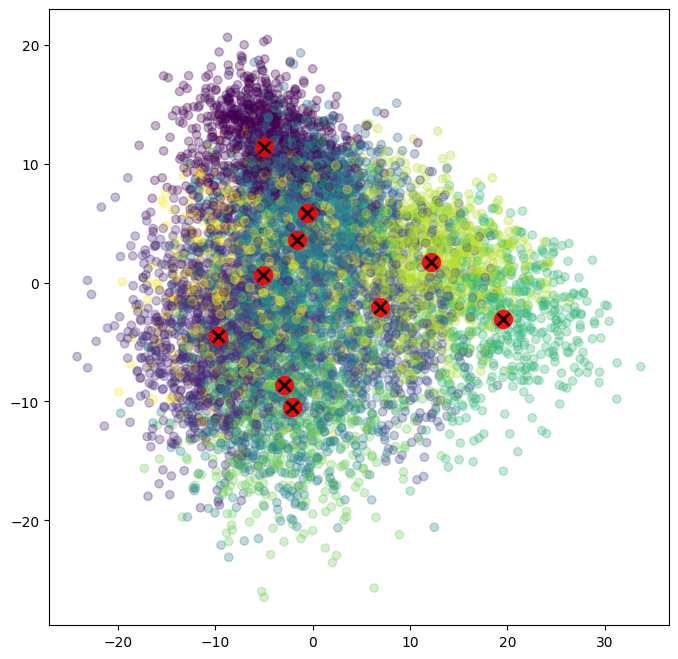

In [28]:
def plot_data(X):
    plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

def plot_centroids(centroids, weights=None, circle_color='r', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=35, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=2, linewidths=12,
                color=cross_color, zorder=11, alpha=1)

def plot_clusters(clusterer, X):
    labels = clusterer.predict(X)
    pca = PCA(n_components=2)
    x_2d = pca.fit_transform(X)
    plt.scatter(x_2d[:, 0], x_2d[:, 1], c=labels, alpha=0.3)
    plot_centroids(clusterer.cluster_centers_)

plt.figure(figsize=(8, 8))
plot_clusters(kmeans, x_less_dimensions)

The plot shows all 8355 paintings reduced to 2 dimensions using PCA. Each colour represents a different cluster and the red crosses marking the centre of each cluster. The clusters overlap quite a bit in the centre, which makes sense, many art styles share visual similarities. The more distinct clusters appear towards the edges, which likely represent styles that are visually very different.

Now let's test everything out on image 1

In [29]:
query_x = scaler.transform((query_features.reshape(1,-1)))
query_pca = pca.transform(query_x)

What cluster is image 1 closest to? 

In [30]:
cluster = kmeans.predict(query_pca)
print(cluster)

[8]


In [31]:
results_df['cluster'] = kmeans.labels_
cluster_paintings = results_df[results_df['cluster'] == cluster[0]]
print(cluster_paintings['genre'].value_counts())

genre
Impressionism                              228
Post-Impressionism                         207
Romanticism                                 60
Northern Renaissance                        53
Surrealism,Impressionism                    41
Impressionism,Post-Impressionism            41
Primitivism                                 34
Symbolism,Post-Impressionism                32
Symbolism,Art Nouveau                       24
Neoplasticism                               21
Realism                                     16
Symbolism                                   13
Expressionism,Abstractionism,Surrealism     13
Cubism                                      12
Baroque                                     11
Surrealism                                  10
Expressionism,Abstractionism                 8
Realism,Impressionism                        8
Suprematism                                  6
Pop Art                                      4
Byzantine Art                                3
Symboli

The cluster seems to be dominated by impressionist and post-impressionist paintings. 

# Matching the mistery paintings to the famous ones 

Now let's do the rest of the images I have. (7 in total )

Let's match first all of the mystery paintings to their respective cluster.

In [32]:
art_images = glob.glob("mystery-art/*.JPG")

for image_path in art_images:
    query_features = get_features(image_path)
    query_x = scaler.transform(query_features.reshape(1, -1))
    query_pca = pca.transform(query_x)
    cluster = kmeans.predict(query_pca)
    print(f"{image_path} → cluster {cluster[0]}")

mystery-art/art4.JPG → cluster 1
mystery-art/art5.JPG → cluster 2
mystery-art/art7.JPG → cluster 1
mystery-art/art6.JPG → cluster 3
mystery-art/art2.JPG → cluster 3
mystery-art/art3.JPG → cluster 8
mystery-art/art1.JPG → cluster 8


That doesn't tell us much so let's actually match them directly with their respective styles.

In [33]:
for image_path in art_images:
    query_features = get_features(image_path)
    query_x = scaler.transform(query_features.reshape(1, -1))
    query_pca = pca.transform(query_x)
    cluster = kmeans.predict(query_pca)
    
    cluster_paintings = results_df[results_df['cluster'] == cluster[0]]
    top_genre = cluster_paintings['genre'].value_counts().index[0]
    
    print(f"{image_path} - {top_genre}")

mystery-art/art4.JPG - Baroque
mystery-art/art5.JPG - Impressionism
mystery-art/art7.JPG - Baroque
mystery-art/art6.JPG - Post-Impressionism
mystery-art/art2.JPG - Post-Impressionism
mystery-art/art3.JPG - Impressionism
mystery-art/art1.JPG - Impressionism


Now we know what style my paintings are most similar to!

To make things easier to understand, it would help to visualise the results. It’s quite hard to imagine the mystery painting and the style it should match just from a description. Instead, we can show the mystery painting together with the 12 closest famous paintings from the dataset, based on the output above. This way we can see how accurate the matches are and whether the paintings actually look stylistically similar, or if the model was a bit off in some cases.

I’ll start by trying this with just one painting first.

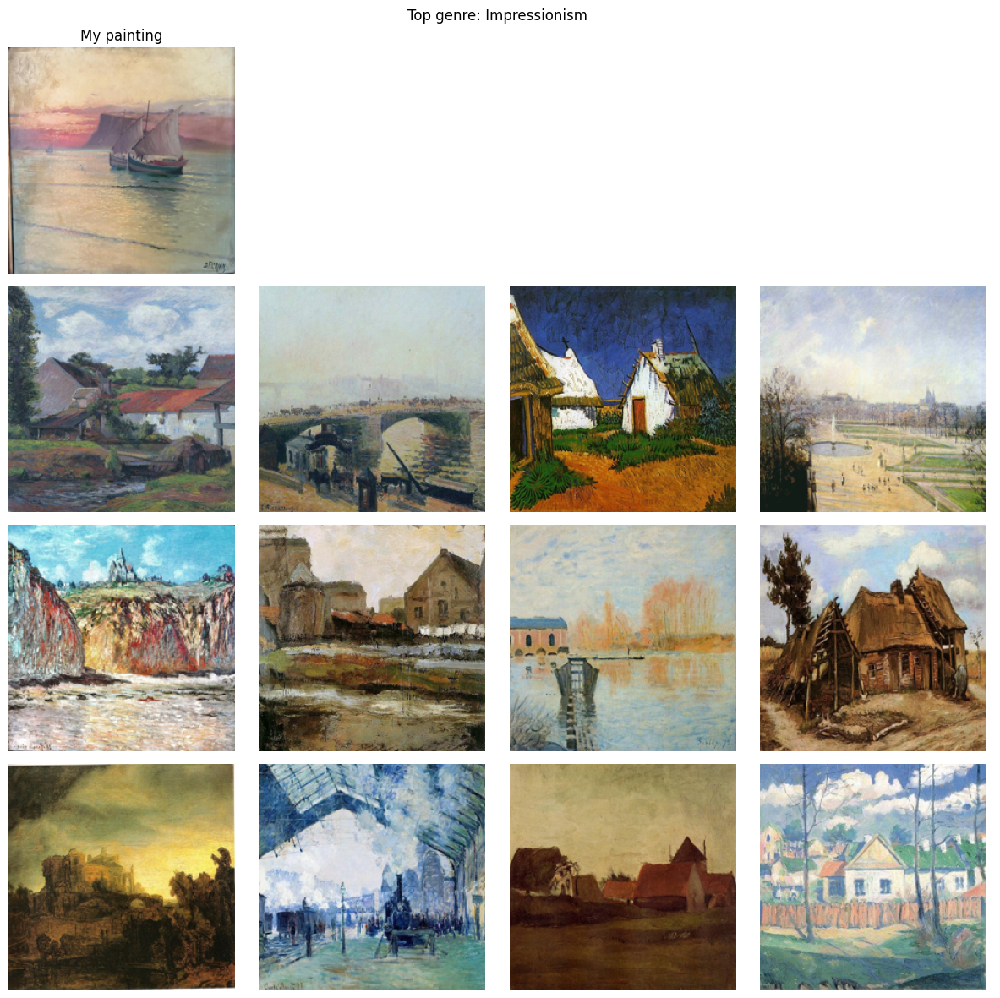

In [34]:
# show my photo + 12 closest paintings
cluster_dist = x_dist[:, cluster[0]]
representative_indexes = cluster_dist.argsort(axis=0)
all_paths = np.array(results_df['path'])
to_show = all_paths[representative_indexes[:12]]

pil_images = [Image.open(p).resize((224, 224)) for p in to_show]

fig, axes = plt.subplots(4, 4, figsize=(12, 12))
fig.suptitle(f"Top genre: {top_genre}")

# i also want to display my image  
axes[0][0].imshow(Image.open(image_path).resize((224, 224)))
axes[0][0].set_title("My painting")
axes[0][0].axis('off')

#hide empty slots in first row
for i in range(1, 4):
    axes[0][i].axis('off')

#12 closest paintings
for i, (img, ax) in enumerate(zip(pil_images, axes[1:].flatten())):
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()

I think this output is quite accurate. I can see similarities between my mystery painting and Impressionist works, particularly in the use of colour, landscapes, and the overall atmosphere of the painting. The first few paintings the model matched it with also appear visually similar. 

# Results and Visualisation

Let's try the same code with all 8 mystery paintings I have. I will only display 4 images per painting now

mystery-art/art4.JPG → Baroque


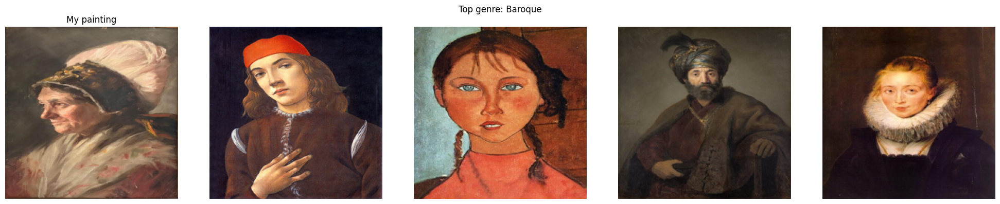

mystery-art/art5.JPG → Impressionism


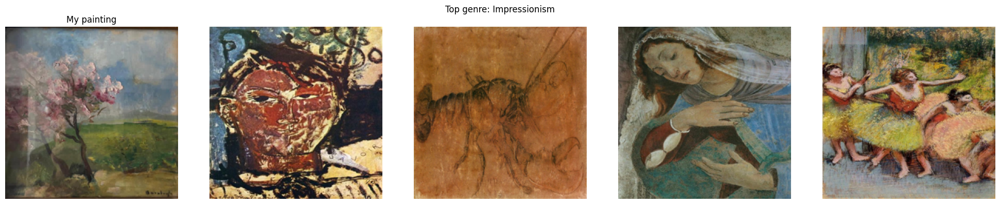

mystery-art/art7.JPG → Baroque


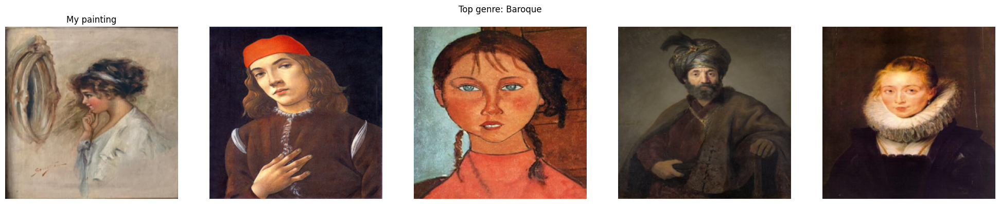

mystery-art/art6.JPG → Post-Impressionism


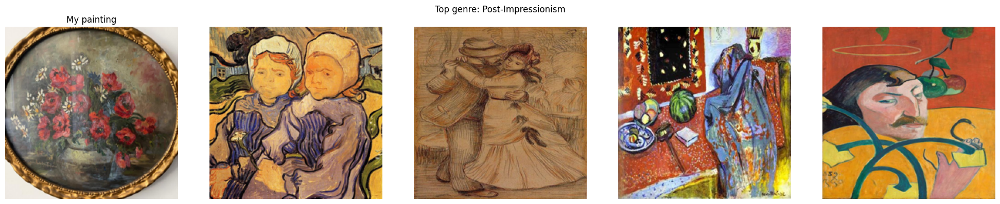

mystery-art/art2.JPG → Post-Impressionism


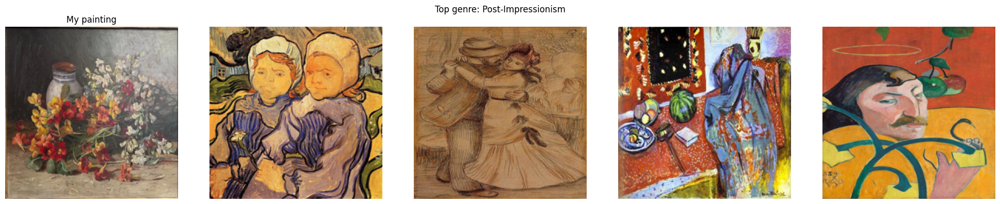

mystery-art/art3.JPG → Impressionism


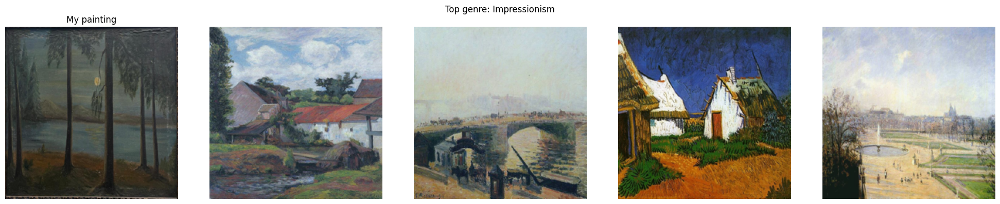

mystery-art/art1.JPG → Impressionism


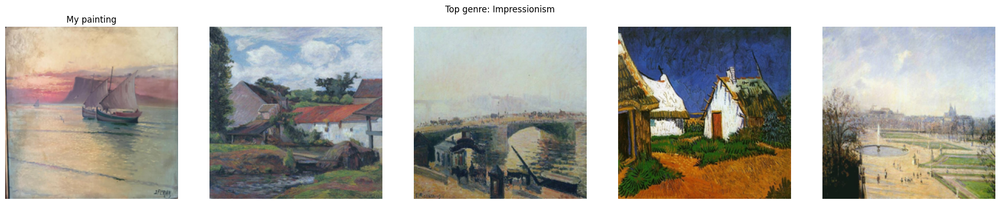

In [35]:
for image_path in art_images:
    query_features = get_features(image_path)
    query_x = scaler.transform(query_features.reshape(1, -1))
    query_pca = pca.transform(query_x)
    cluster = kmeans.predict(query_pca)
    
    cluster_paintings = results_df[results_df['cluster'] == cluster[0]]
    top_genre = cluster_paintings['genre'].value_counts().index[0]
    print(f"{image_path} → {top_genre}")
    
    cluster_dist = x_dist[:, cluster[0]]
    representative_indexes = cluster_dist.argsort(axis=0)
    all_paths = np.array(results_df['path'])
    to_show = all_paths[representative_indexes[:4]]
    
    pil_images = [Image.open(p).resize((224, 224)) for p in to_show]

    

    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    fig.suptitle(f"Top genre: {top_genre}")
 
    #used an LLM to help me plot the images in a nicer way
    axes[0].imshow(np.array(Image.open(image_path).resize((224, 224))))
    axes[0].set_title("My painting")
    axes[0].axis('off')

    for i, (img, ax) in enumerate(zip(pil_images, axes[1:])):
        ax.imshow(img)
        ax.axis('off')

    plt.tight_layout()
    plt.show()
    plt.close()

Out of all these outputs, I think some are relatively close to the truth. The three paintings (art3, art5, and art1) that were matched with Impressionism seem quite accurate. The chromatic palette is similar, the objects and general landscape resemble each other, and they could plausibly come from a similar time period.


I also found it interesting that art7 was matched with Baroque. That result makes me want to look more closely into that art style and better understand its typical qualities and features. I assume in this scenario both art7 and art4 got matched with baroque as they represent portraits. 


The most inaccurate match is art6, which was classified as Cubism. However, I think there is a possible explanation for this. The image contains a lot of white space (and I didn’t have a better way of cropping it), which may have influenced the model. The paintings it matched with tend to have stronger colour contrasts, which could have led to this association.
Interestingly enough, after running the model again art6 is now coming up as post-impressionism! So the model was very unsure of that painting from the beginning. 


Let’s also examine which artist the mystery painting is most closely matched with

In [36]:
#used an LLM for help as I kept running into errors
for image_path in art_images:
    query_features = get_features(image_path)
    query_x = scaler.transform(query_features.reshape(1, -1))
    query_pca = pca.transform(query_x)
    cluster = kmeans.predict(query_pca)
    
    cluster_paintings = results_df[results_df['cluster'] == cluster[0]]
    top_genre = cluster_paintings['genre'].value_counts().index[0]
    top_artist = cluster_paintings['artist'].value_counts().index[0]
    print(f"{image_path} → {top_genre} → most similar to {top_artist}")


mystery-art/art4.JPG → Baroque → most similar to Rembrandt
mystery-art/art5.JPG → Impressionism → most similar to Edgar Degas
mystery-art/art7.JPG → Baroque → most similar to Rembrandt
mystery-art/art6.JPG → Post-Impressionism → most similar to Vincent van Gogh
mystery-art/art2.JPG → Post-Impressionism → most similar to Vincent van Gogh
mystery-art/art3.JPG → Impressionism → most similar to Vincent van Gogh
mystery-art/art1.JPG → Impressionism → most similar to Vincent van Gogh


I think this part is definitely inaccurate. What probably happened is that those painters have the most images in the dataset I downloaded, which means they dominate the results for those styles. It was still worth trying to see if we could find something meaningful, but unfortunately that doesn’t seem to be the case here.


# Conclusion

This was a really interesting project to work on.
 Lowering the number of clusters to 10 definitely improved the results a lot, the first attempt was pointing mostly towards Proto Renaissance which didn't feel right at all. Cropping the images also helped, and I imagine if the photos my cousin sent were clearer it would have been even better, especially the ones with reflections in them.

The part I'm most happy with is the visual output showing the closest paintings, that's by far the most interesting result. The artist matching felt less reliable, but it was still worth exploring.

If I had more time, I'd look for more specialised datasets, now that I know most of the paintings are clustering closest to Impressionism, I'd try finding a dedicated Impressionist dataset to see if I could get an even closer match.

One thing worth mentioning is that MobileNet was trained on everyday photos, not paintings, so it might be biased towards certain visual styles without me even realising it. A model trained specifically on art would probably give much more accurate results. Something to keep in mind when interpreting everything here!

# Limitation & Bias

One important limitation to consider is the dataset I am using. The dataset contains only around 50 artists and focuses primarily on well-known Western painters. This means it does not represent the full diversity of artistic styles or cultural contexts in art history.

There is also an imbalance in the number of images per artist, which may influence the clustering results, as artists with more paintings are more likely to dominate certain clusters.

Although the dataset includes a variety of artistic styles, the limited number of artists restricts how much stylistic diversity the model can learn from. If I had more time, I would explore using a different dataset, for example one focused specifically on Impressionist painters, or potentially create my own curated dataset.

# LLM Disclaimer
I have used an LLM for proofreading and rewriting some sentences. I have also used it on some sections of my code wherever mentioned.  